In [ ]:
# Importing required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


import torch
import torchvision
import torch.optim as optim
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F

from sklearn import preprocessing
from skimage import data, color, img_as_float
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler

import os
import requests
import warnings

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
%config InlineBackend.figure_format = 'retina'
%matplotlib inline


# **Original Image**

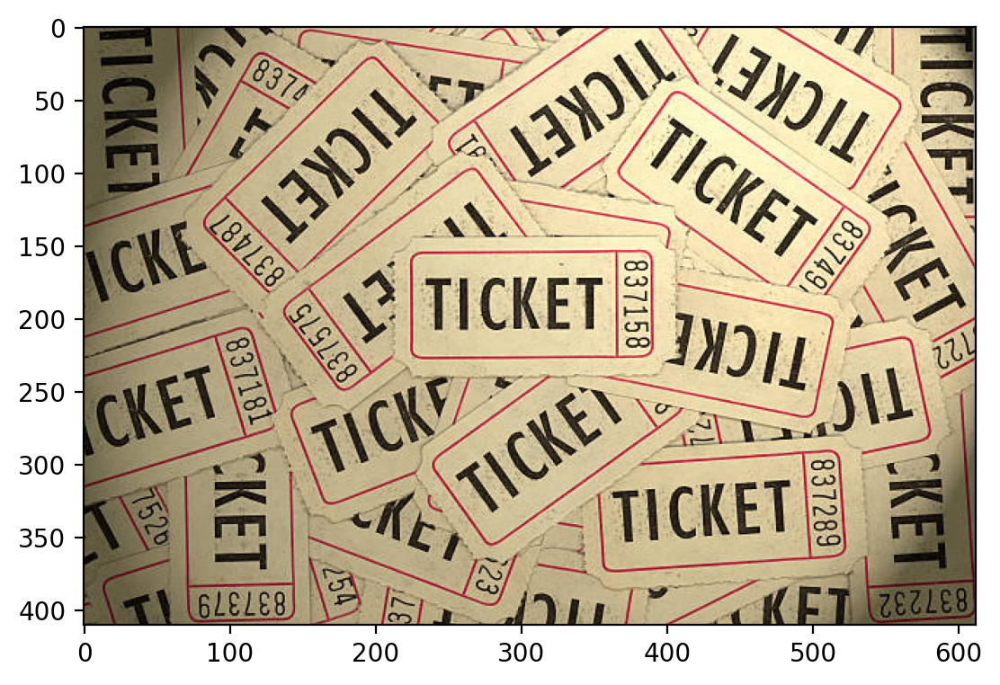

In [ ]:
from PIL import Image
img = Image.open("/content/ticket.jpg")
plt.imshow(img)

In [ ]:
img = torchvision.io.read_image("/content/ticket.jpg").float()
img = img.clone().detach().float()
print(img.shape) # Dimensions of the image (No of Channels, Height, Width)

torch.Size([3, 410, 612])


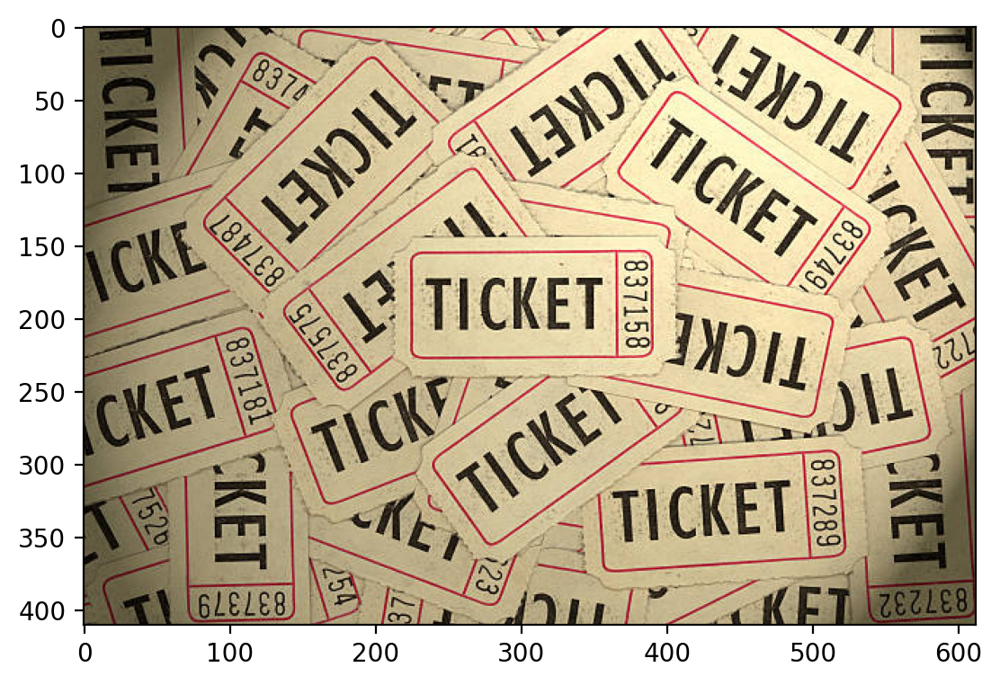

In [ ]:
plt.imshow(img.permute(1,2,0)/255)

# **Cropped Image** (on which we will work)

In [ ]:
crop_img = torchvision.transforms.functional.crop(img, 50, 150, 250, 250)
crop_img.shape

torch.Size([3, 250, 250])

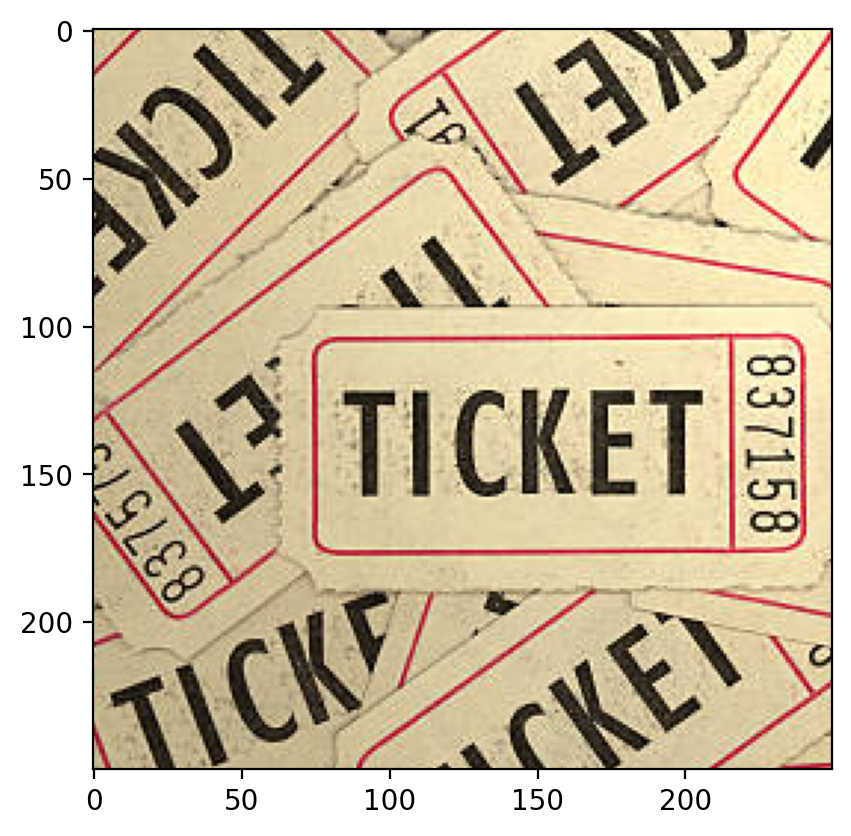

In [ ]:
plt.imshow(crop_img.permute(1,2,0)/255)

# **Showing the detailed process for 1 patch and a specific r value**

In [ ]:
def generate_img_patch():
  randx = np.random.randint(0,200)
  randy = np.random.randint(0,200)
  img_patch = torchvision.transforms.functional.crop(crop_img,randx,randy, 50, 50)
  return randx,randy,img_patch

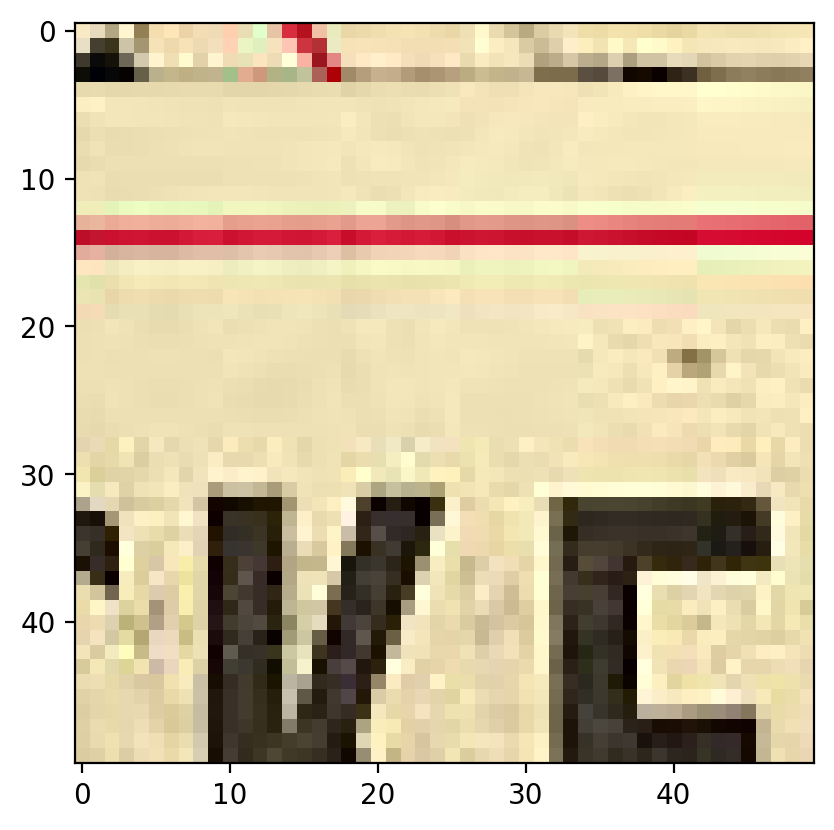

In [ ]:
x1,y1,img_patch1 = generate_img_patch()
plt.imshow(img_patch1.permute(1,2,0)/255)

In [ ]:
def factorize(img, r, epsilon = 0.001, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    img = img.to(device)

    # Randomly initialize W and H
    W = torch.randn(3,50,r, requires_grad=True, device=device)
    H = torch.randn(3,r,50, requires_grad=True, device=device)

    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(img)
    e = 0 # epoch

    while True:
      # Compute the loss
        diff_matrix = torch.matmul(W, H) - img
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        optimizer.zero_grad()# Zero the gradients
        loss.backward() # Backpropagate
        optimizer.step() # Update the parameters

        e = e+1
        if e>1:   # for check
            if prev_loss-loss < epsilon:
                break
        prev_loss = loss
    return W, H, loss

In [ ]:
low_rank = [5,10,25,50]
W = [0,0,0,0]
H = [0,0,0,0]
loss = [0,0,0,0]
rand_num = [0.85,0.62,0.39,0.16]

W[0], H[0], loss[0] = factorize(img_patch1, 5,device=torch.device("cpu"))

In [ ]:
def compute_rmse(tensor1, tensor2, r):
    assert tensor1.shape == tensor2.shape, "Tensors must have the same shape"
    mse = torch.mean((tensor1 - tensor2) ** 2)
    rmse = torch.sqrt(mse)
    print("RMSE for r="+str(r)+" -->",rmse.item())
    return

def compute_psnr(tensor1, tensor2, r, max_pixel_value=1.0):
    mse = torch.mean((tensor1 - tensor2) ** 2)
    psnr = 10 * torch.log10(max_pixel_value ** 2 / mse)
    print("PSNR for r="+str(r)+" -->",psnr.item())
    return

Loss for r=5 --> 1366.03662109375
RMSE for r=5 --> 15.773615837097168
PSNR for r=5 --> -23.95862579345703




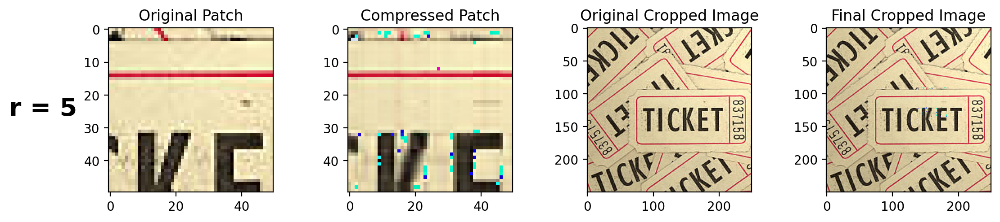

In [ ]:
def display_result(x,y,crop_img,W,H,i,r,fig,img_patch,figty):
  duplicate = crop_img.clone().permute(1,2,0)
  modified_patch = (torch.matmul(W, H).cpu().detach()).permute(1,2,0) # Reconstruction
  # print(modified_patch.shape)
  duplicate[x:x+50,y:y+50,:] = modified_patch
  # print(duplicate[random_int_x:random_int_x+50,random_int_y:random_int_y+50,:].shape)
  duplicate_np = duplicate.numpy()
  # print(duplicate_np.shape)
  final_crop_img = Image.fromarray(np.uint8(duplicate_np))

  compute_rmse(modified_patch, img_patch.permute(1,2,0), r)
  compute_psnr(modified_patch, img_patch.permute(1,2,0), r)
  print("\n")

  ax1 = fig.add_subplot(4, 4, 4*i+1)
  ax2 = fig.add_subplot(4, 4, 4*i+2)
  ax3 = fig.add_subplot(4, 4, 4*i+3)
  ax4 = fig.add_subplot(4, 4, 4*i+4)
  ax1.imshow(np.uint8(img_patch.permute(1,2,0)))
  ax1.set_title("Original Patch")
  ax2.imshow(np.uint8(modified_patch))
  ax2.set_title("Compressed Patch")
  ax3.imshow(np.uint8(crop_img.permute(1,2,0)))
  ax3.set_title("Original Cropped Image")
  ax4.imshow(final_crop_img)
  ax4.set_title("Final Cropped Image")
  fig.text(0.05, figty, 'r = '+str(r), ha='left', fontsize=20, weight='bold')
  plt.tight_layout(rect=[0.1, 0, 1, 1])

fig = plt.figure(figsize=(12,9))

print("Loss for r=5 -->",loss[0].item())
display_result(x1,y1,crop_img,W[0],H[0],0,5,fig,img_patch1,0.85)
plt.show()

# **Results (Patch 1)**

Loss for r=5 --> 1366.0576171875
RMSE for r=5 --> 15.7738618850708
PSNR for r=5 --> -23.95876121520996


Loss for r=10 --> 732.8072509765625
RMSE for r=10 --> 8.461715698242188
PSNR for r=10 --> -18.54916763305664


Loss for r=25 --> 164.9169921875
RMSE for r=25 --> 1.9042853116989136
PSNR for r=25 --> -5.594640254974365


Loss for r=50 --> 33.42861557006836
RMSE for r=50 --> 0.38895416259765625
PSNR for r=50 --> 8.202032089233398




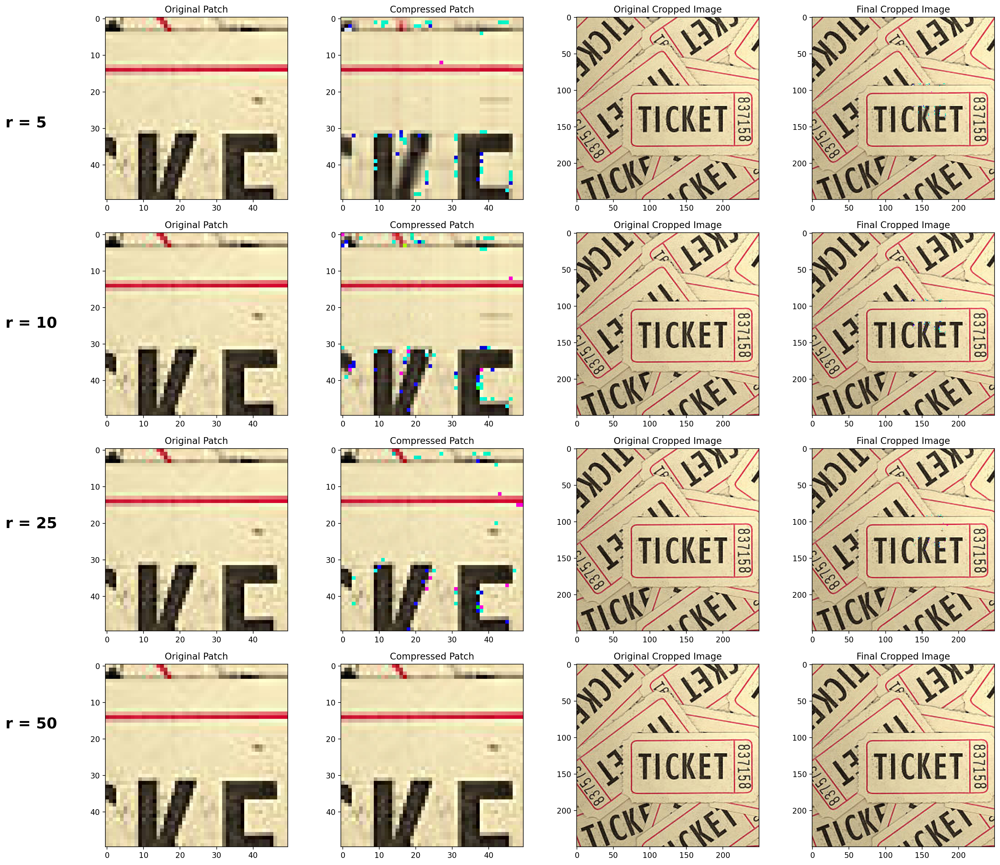

In [ ]:
fig = plt.figure(figsize=(20,16))
for i in range(4):
  W[i], H[i], loss[i] = factorize(img_patch1,low_rank[i])
  print("Loss for r="+str(low_rank[i])+" -->",loss[i].item())
  display_result(x1,y1,crop_img,W[i],H[i],i,low_rank[i],fig,img_patch1,rand_num[i])

plt.show()

# **Results (Patch 2)**

Loss for r=5 --> 1728.930419921875
RMSE for r=5 --> 19.963956832885742
PSNR for r=5 --> -26.004932403564453


Loss for r=10 --> 928.5799560546875
RMSE for r=10 --> 10.722306251525879
PSNR for r=10 --> -20.605764389038086


Loss for r=25 --> 148.28402709960938
RMSE for r=25 --> 1.7122251987457275
PSNR for r=25 --> -4.671217918395996


Loss for r=50 --> 32.145416259765625
RMSE for r=50 --> 0.37672311067581177
PSNR for r=50 --> 8.479555130004883




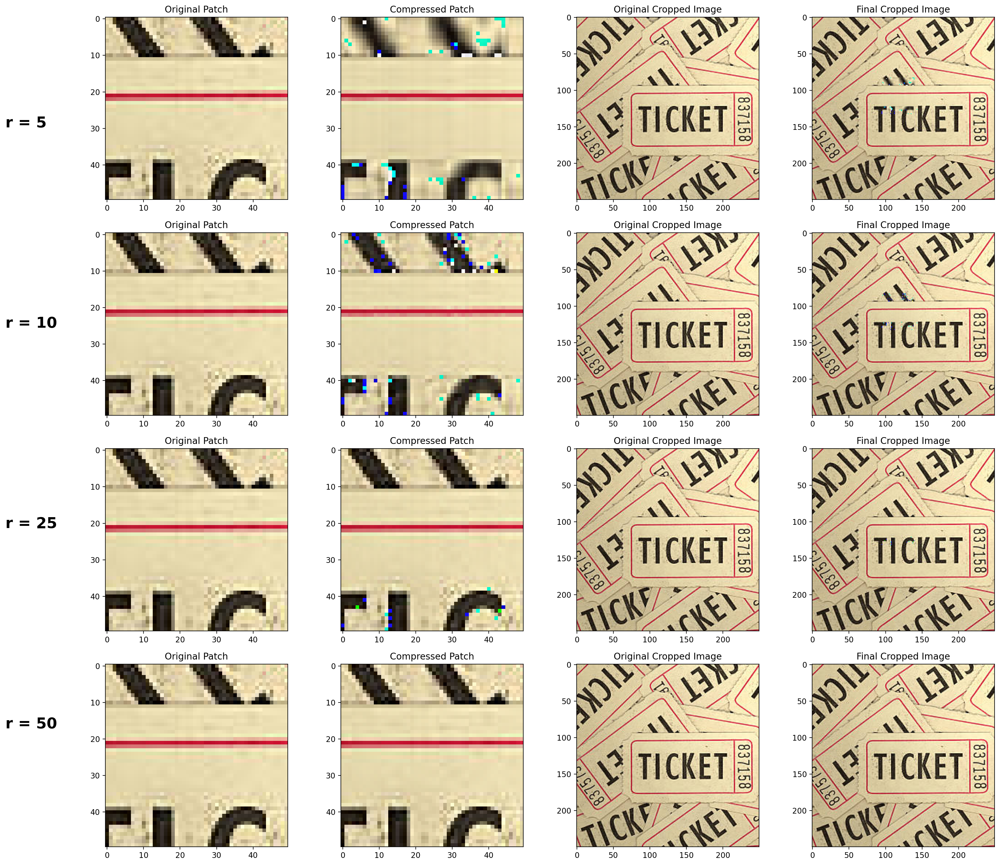

In [ ]:
fig = plt.figure(figsize=(20,16))
x2,y2,img_patch2 = generate_img_patch()
for i in range(4):
  W[i], H[i], loss[i] = factorize(img_patch2,low_rank[i])
  print("Loss for r="+str(low_rank[i])+" -->",loss[i].item())
  display_result(x2,y2,crop_img,W[i],H[i],i,low_rank[i],fig,img_patch2,rand_num[i])

plt.show()

# **Results (Patch3)**

Loss for r=5 --> 763.2628784179688
RMSE for r=5 --> 8.81338882446289
PSNR for r=5 --> -18.90285873413086


Loss for r=10 --> 522.0724487304688
RMSE for r=10 --> 6.0283613204956055
PSNR for r=10 --> -15.603985786437988


Loss for r=25 --> 183.65621948242188
RMSE for r=25 --> 2.1206676959991455
PSNR for r=25 --> -6.529452800750732


Loss for r=50 --> 31.01921272277832
RMSE for r=50 --> 0.3628254234790802
PSNR for r=50 --> 8.806046485900879




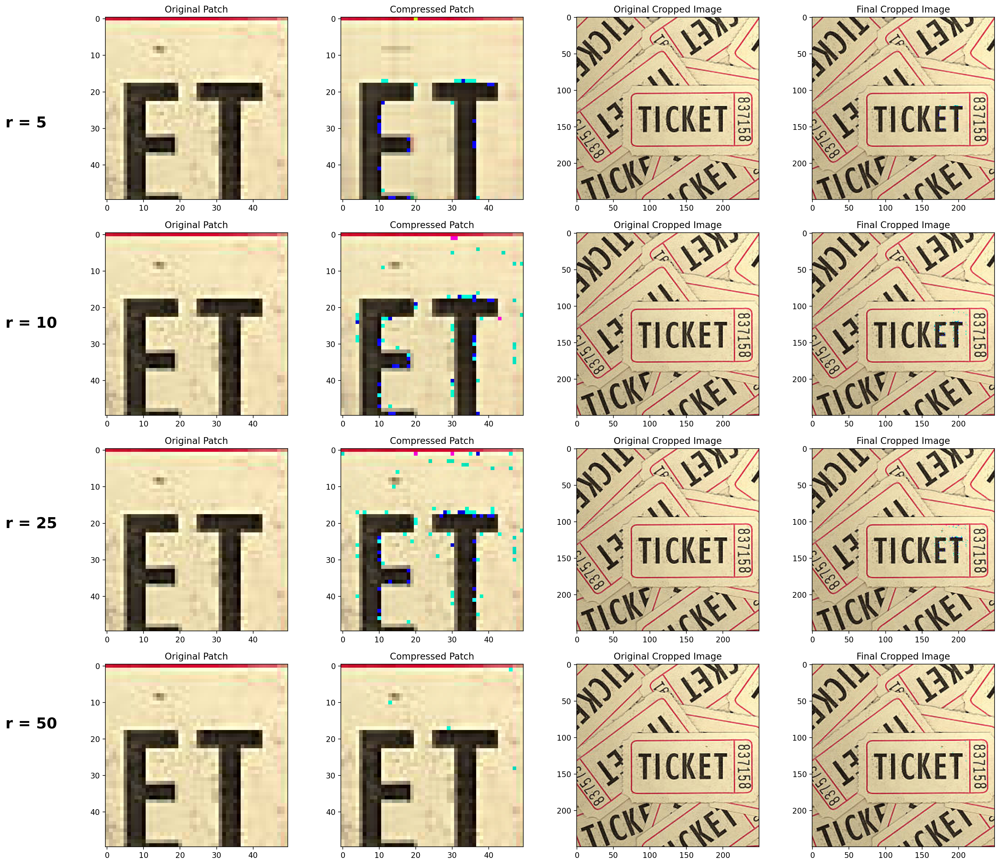

In [ ]:
fig = plt.figure(figsize=(20,16))
x3,y3,img_patch3 = generate_img_patch()
for i in range(4):
  W[i], H[i], loss[i] = factorize(img_patch3,low_rank[i])
  print("Loss for r="+str(low_rank[i])+" -->",loss[i].item())
  display_result(x3,y3,crop_img,W[i],H[i],i,low_rank[i],fig,img_patch3,rand_num[i])

plt.show()